<a href="https://colab.research.google.com/github/radhikamodi05/CV_face_mask_detection/blob/main/Face_Mask_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Advanced Certification Programme in AI and MLOps
## A programme by IISc and TalentSprint
### Mini Project: Face Mask Detection using Convolutional Neural Networks

## Learning Objectives

At the end of the experiment, you will be able to :

* load the image dataset using ImageDataGenerator from the path directory
* perform data augmentation on the fly and create  batches of the dataset
* build the convolutional neural networks for classification problem
* visualize & interpret what CNN layers learn
* use the transfer learning (pre-trained models) for classification problems

## Introduction

This project uses a Deep Neural Network, more specifically a Convolutional Neural Network, to differentiate between images of people, with masks, without masks and incorrectly placed masks. Manually built and pretrained networks will be used to perform this classification task.

**Face-Mask-Detection-Using-CNN**

* Outbreak of the Coronavirus pandemic has created various changes in the lifestyle of everyone around the world.
* Among these changes, wearing a mask has been very vital to every individual.
* Detection of people who are not wearing masks is a challenge due to the large populations.
* This face mask detection project can be used in schools, hospitals, banks, airports etc as a digitalized scanning tool.
  - The technique of detecting people’s faces and segregating them into three classes namely the people with masks and people without masks and partial masks is done with the help of image processing and deep learning.
* With the help of this project, a person who is monitoring the face mask status for a particular firm can be seated in a remote area and still monitor efficiently and give instructions accordingly.

![img](https://cdn.iisc.talentsprint.com/CDS/MiniProjects/dataset-images-with-mask.jpg)

## Dataset

The data for this mini-project is collected from various sources including the masked images from internet and general frontal face images considered as without mask. This dataset consists of 5029 train images and 1059 test images with 3 classes `with_mask`, `without_mask` and `partial_mask`

Many people are not correctly wearing their masks due to bad practices, bad behaviors or vulnerability of individuals (e.g., children, old people). For these reasons, several mask wearing campaigns intend to sensitize people about this problem and good practices. In this sense, this work proposes three types of masked face detection dataset
  
- Without Mask/ With Mask/ Partial Mask
  
Note that this dataset contains some annotated (artificially generated) masks to augment the 'masked' data category.

## Problem Statement

To build and implement a Convolutional Neural Network model to classify between masked/unmasked/partially masked faces.

In [1]:
#@title Download the data
!wget -qq https://cdn.iisc.talentsprint.com/CDS/MiniProjects/MP2_FaceMask_Dataset.zip
!unzip -qq MP2_FaceMask_Dataset.zip
print("Data Downloaded Successfuly!!")

Data Downloaded Successfuly!!


## Grading = 10 Points

### Import Required packages

In [36]:
from tensorflow.keras.optimizers import RMSprop
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, Input, ZeroPadding2D, BatchNormalization, Activation, MaxPooling2D, Flatten, Dense,Dropout
from keras.models import Model, load_model
from tensorflow.keras.utils import plot_model
from keras.callbacks import EarlyStopping, TensorBoard, ModelCheckpoint
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.utils import shuffle
import numpy as np
import pandas as pd
import PIL
from matplotlib import pyplot as plt
from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.resnet50 import ResNet50
import tensorflow as tf
from tensorflow import keras
import glob, os

# Part-A [5-Marks]

### Analyzing the shape and distribution of datasets [1 Mark]

Store the list of the paths from the training dataset for images of partial-mask, with_mask, and without_mask in variables partial, on, and off respectively. Hint : [Check the 'glob' section.](https://realpython.com/working-with-files-in-python/)

In [3]:
os.listdir('MP2_FaceMask_Dataset/train')

['without_mask', 'partial_mask', 'with_mask']

In [4]:
train_path = 'MP2_FaceMask_Dataset' + '/train'
test_path = 'MP2_FaceMask_Dataset' + '/test'
partial = glob.glob(test_path + '/partial_mask/*')
on = glob.glob(test_path + '/with_mask/*')
off = glob.glob(test_path + '/without_mask/*')

In [5]:
os.listdir('MP2_FaceMask_Dataset/train/partial_mask')

['68538_Mask_Mouth_Chin.jpg',
 '51281_Mask_Mouth_Chin.jpg',
 '51506_Mask_Mouth_Chin.jpg',
 '51514_Mask_Mouth_Chin.jpg',
 '51845_Mask_Mouth_Chin.jpg',
 '51823_Mask_Mouth_Chin.jpg',
 '68760_Mask_Mouth_Chin.jpg',
 '68358_Mask_Mouth_Chin.jpg',
 '68370_Mask_Mouth_Chin.jpg',
 '51158_Mask_Nose_Mouth.jpg',
 '68717_Mask_Mouth_Chin.jpg',
 '51104_Mask_Mouth_Chin.jpg',
 '51165_Mask_Mouth_Chin.jpg',
 '68472_Mask_Mouth_Chin.jpg',
 '51448_Mask_Mouth_Chin.jpg',
 '68276_Mask_Mouth_Chin.jpg',
 '68488_Mask_Mouth_Chin.jpg',
 '51570_Mask_Mouth_Chin.jpg',
 '68413_Mask_Mouth_Chin.jpg',
 '51620_Mask_Mouth_Chin.jpg',
 '68555_Mask_Mouth_Chin.jpg',
 '51461_Mask_Mouth_Chin.jpg',
 '51679_Mask_Mouth_Chin.jpg',
 '51925_Mask_Mouth_Chin.jpg',
 '51463_Mask_Mouth_Chin.jpg',
 '68232_Mask_Chin.jpg',
 '51336_Mask_Mouth_Chin.jpg',
 '68718_Mask_Chin.jpg',
 '51307_Mask_Mouth_Chin.jpg',
 '68743_Mask_Mouth_Chin.jpg',
 '51697_Mask_Mouth_Chin.jpg',
 '51530_Mask_Mouth_Chin.jpg',
 '68621_Mask_Mouth_Chin.jpg',
 '68135_Mask_Mouth_Chi

Store paths of all three types of images in one variable. Check and store the height and width of each image.

Hint: Use PIL(PIL.Image.open) library to open the image from the path, convert it into a NumPy array and check for shape.  

In [6]:
from matplotlib.image import imread
os.listdir(train_path + '/partial_mask')
# t = np.asarray(PIL.Image.open(train_path + '/partial_mask'+ '/68501_Mask_Mouth_Chin.jpg'))
t = imread(train_path + '/partial_mask'+ '/51369_Mask_Mouth_Chin.jpg')
t.shape

(1024, 1024, 3)

(160, 160, 3)


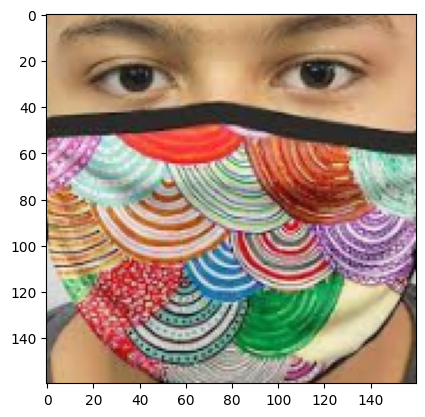

In [7]:
from matplotlib.image import imread
im = train_path + "/with_mask" + '/imagen_m_on314.png'
plt.imshow(imread(im))
plt.show
print(imread(im).shape)

Discuss the distribution of images. Calculate and display max, min and average of height and width of all images.

5184


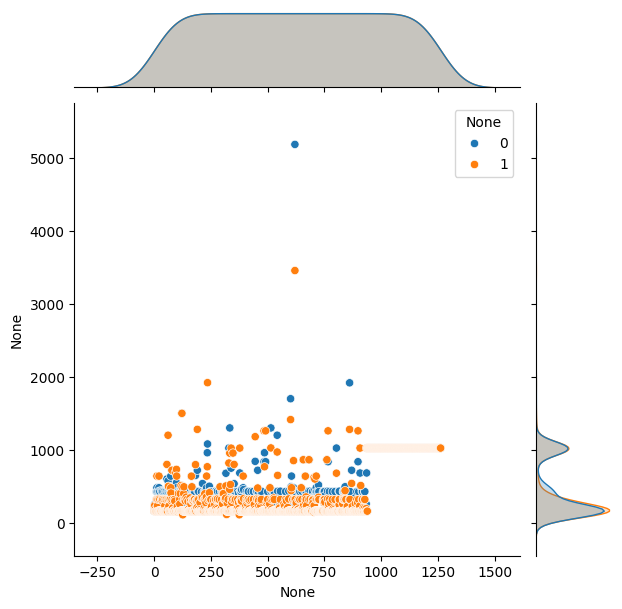

In [8]:
import seaborn as sns
dim1 = []
dim2 = []
all = on + off + partial
for image_file in all:
    # img = imread(image_file)
    img = np.asarray(PIL.Image.open(image_file))
    dim1.append(img.shape[0])
    dim2.append(img.shape[1])

sns.jointplot((dim1,dim2))
print(max(dim1))

### Visualize the sample images of each class before augmentation [1 Mark]

<function matplotlib.pyplot.show(close=None, block=None)>

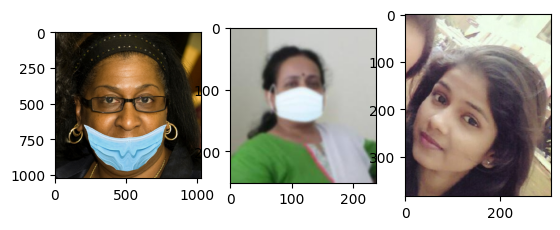

In [9]:
# im = train_path + "/without_mask" + '/467.jpg'
im1 = partial[0]
im2 = on[2]
im3 = off[4]
fig, axes = plt.subplots(1,3)
axes[0].imshow(imread(im1))
axes[1].imshow(imread(im2))
axes[2].imshow(imread(im3))
plt.show

### Load the images using ImageDataGenerator [1 Mark]

There are two main steps involved in creating the generator.
1. Instantiate ImageDataGenerator with required arguments to create an object
2. Use the `flow_from_directory` command depending on how your data is stored on disk. This is the command that will allow you to generate and get access to batches of data on the fly.

Hint: [link](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator)

In [10]:
TRAINING_DIR = "/content/MP2_FaceMask_Dataset/train/"
VALIDATION_DIR = "/content/MP2_FaceMask_Dataset/test/"

In [11]:

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

In [12]:
train_generator = train_datagen.flow_from_directory(TRAINING_DIR,target_size=(256, 256),color_mode='rgb',batch_size=32, class_mode='categorical')

Found 5029 images belonging to 3 classes.


In [13]:
test_generator = test_datagen.flow_from_directory(VALIDATION_DIR,target_size=(256, 256),color_mode='rgb',batch_size=32, class_mode='categorical')

Found 1259 images belonging to 3 classes.


In [14]:
train_generator[0][1]

array([[0., 0., 1.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 0., 1.]], dtype=float32)

Check class indices

In [15]:
train_generator.class_indices

{'partial_mask': 0, 'with_mask': 1, 'without_mask': 2}

Check the shape of the image from train_generator

In [16]:
train_generator[0][0].shape

(32, 256, 256, 3)

In [17]:
train_generator.image_shape

(256, 256, 3)

### Visualize a few sample images using data generator [1 Mark]

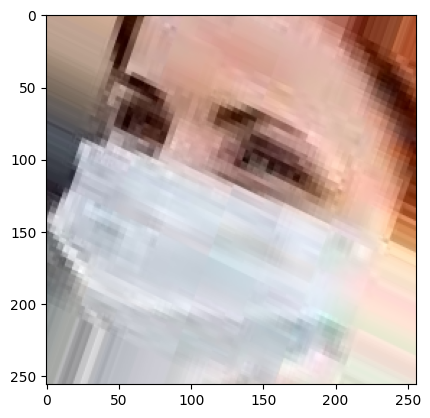

In [18]:
plt.imshow(next(train_generator)[0][0]);

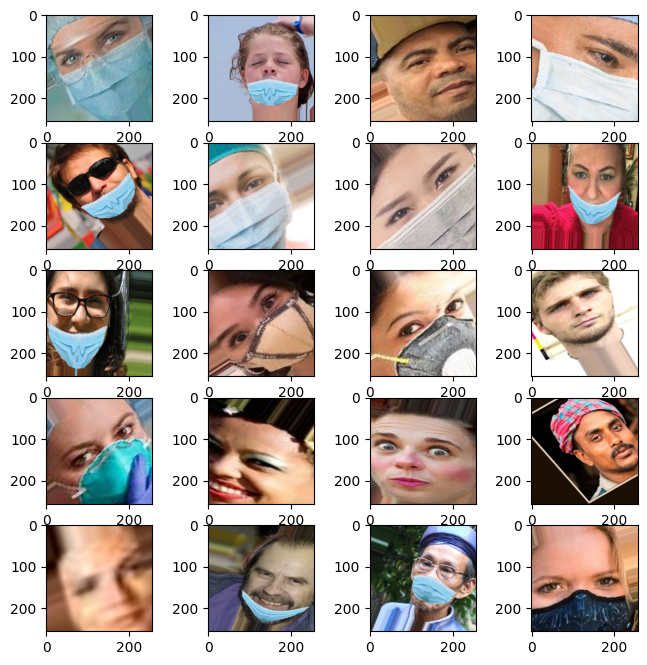

In [19]:
fig = plt.figure(figsize=(8, 8))
columns = 4
rows = 5
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    plt.imshow(next(train_generator)[0][0])
plt.show()

## Build the CNN model using Keras [1 Mark]



**Convolutional Neural Network:** A neural network in which at least one layer is a convolutional layer. A typical convolutional neural network consists of some combination of the following layers:

* convolutional layers
* pooling layers
* dense layers


**Conv2D**  

Passing an image with input shape of 3-D and to calculate the output:

 $O = \frac{n - f + 2p}{s} + 1$

 where

 $n$ = image dimension

 $f$ = filter size

 $p$ = padding

 $s$ = stride

**MaxPool**

The resulting output, when using the "valid" padding option, has a spatial shape (number of rows or columns) of:

O = `math.floor`$(\frac{input shape - pool size)}{ strides}) + 1$ (when input shape >= pool size)

The resulting output shape when using the "same" padding option is:

O = `math.floor`$(\frac{input shape - 1}{strides}) + 1$

by default, stride = None, so stride is same as pool size

Task-flow
* Initialize the network of convolution, maxpooling and dense layers
* Define the optimizer and loss functions
* Fit the model and evaluate the model

**model 1 with 2 convolutional (feature representation) and 2 maxpool layers (down sampling) and 2 dense layers for classification.**

In [20]:
model1 = Sequential([
    Conv2D(filters = 100, kernel_size = (3,3) , activation = 'relu', input_shape = (256,256,3)),          #convolutional layer 1: No. of filters=100, filter size=3x3, activation = relu, input_shap = 224x224x3,
    MaxPooling2D(pool_size = (2,2)),                                                         #Maxpooling2D filter size=2x2

    Conv2D(filters = 100, kernel_size = (3,3), activation = 'relu'),                                  #convolutional layer 2: No. of filters=100, filter size=3x3, activation = relu,
    MaxPooling2D(pool_size = (2,2)),                                                         #Maxpooling2D filter size=2x2

    Flatten(),
    Dense(3, activation = 'softmax')
])
model1.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = 'accuracy')
model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 100)     2800      
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 100)     0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 100)     90100     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 100)       0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 384400)            0         
                                                                 
 dense (Dense)               (None, 3)                 1

In [21]:
def def_callbacks(filepath, mod_chk_mon = "val_loss", earlystop = 0 ):
    callback_list = []

    # Defualt callback
    callback_list.append(keras.callbacks.ModelCheckpoint(filepath, save_best_only = True, monitor = mod_chk_mon))
    if earlystop > 0:
        callback_list.append(keras.callbacks.EarlyStopping(monitor = mod_chk_mon, patience= earlystop))

    return callback_list
#Note: Applying a convolution to an image will make it smaller (if no padding).
#Convolving a 3x3 filter over images means we’ll lose a single pixel on all sides (2 in total).
#In the given case, sliding a 3x3 filter over a 224x224 image results in a 222x222 image

Fit the data to the model

In [22]:
# YOUR CODE HERE
epochs = 6
history  = model1.fit(train_generator, epochs = epochs, validation_data= test_generator, callbacks = def_callbacks("prob1"))

Epoch 1/6
158/158 [==============================] - 106s 626ms/step - loss: 0.7925 - accuracy: 0.7083 - val_loss: 0.4009 - val_accuracy: 0.8546
Epoch 2/6
158/158 [==============================] - 130s 823ms/step - loss: 0.5430 - accuracy: 0.8083 - val_loss: 0.5213 - val_accuracy: 0.8221
Epoch 3/6
158/158 [==============================] - 126s 797ms/step - loss: 0.4713 - accuracy: 0.8336 - val_loss: 0.3709 - val_accuracy: 0.8864
Epoch 4/6
158/158 [==============================] - 119s 748ms/step - loss: 0.4358 - accuracy: 0.8533 - val_loss: 0.2668 - val_accuracy: 0.9198
Epoch 5/6
158/158 [==============================] - 127s 807ms/step - loss: 0.3863 - accuracy: 0.8729 - val_loss: 0.2339 - val_accuracy: 0.9349
Epoch 6/6
158/158 [==============================] - 125s 789ms/step - loss: 0.3755 - accuracy: 0.8739 - val_loss: 0.2536 - val_accuracy: 0.9373


Plot training and validation loss

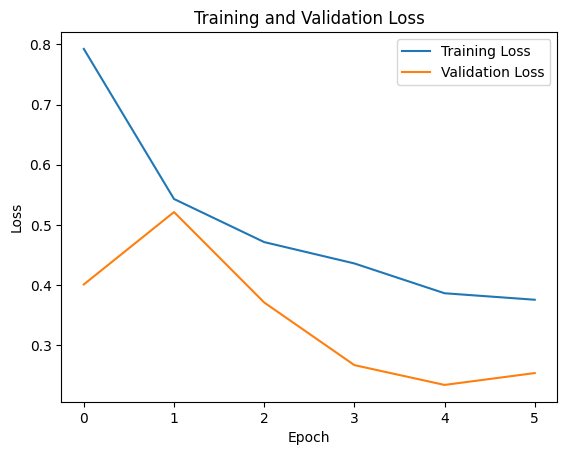

In [23]:
# YOUR CODE HERE
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

# Add legend
plt.legend()

# Show the plot
plt.show()

**model 2 with few more conv layers**

Task-flow
* Initialize the network of convolution, maxpooling and dense layers
* Define the optimizer and loss functions
* Define callback list
* Fit the model and evaluate the model

Define the model

In [24]:
model2 = Sequential([
    Conv2D(16, (3,3), activation='relu', input_shape=(256,256,3)),
    MaxPooling2D(2,2),

    Conv2D(32, (3,3), activation='relu'),
    MaxPooling2D(2,2),

    Conv2D(64, (2,2),activation='relu'),
    MaxPooling2D(2,2),

    Conv2D(128, (2,2),activation='relu'),
    MaxPooling2D(2,2),

    Flatten(),
    Dropout(0.5),
    Dense(1920, activation='relu'),
    BatchNormalization(),
    Dense(480, activation='relu'),
    Dense(32, activation='relu'),
    Dense(train_generator.num_classes, activation='softmax')
])

Compile the model

In [25]:
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['acc'])

Define Callbacks

In [26]:
callbacks_list = [EarlyStopping(monitor="val_loss", patience=2),
                  ModelCheckpoint("mnist_model_checkpoint",save_best_only=True),]

Fit the data to the model

In [27]:
history2 = model2.fit(train_generator, epochs=5, validation_data=test_generator, callbacks=callbacks_list)

Epoch 1/5
158/158 [==============================] - 151s 873ms/step - loss: 0.4779 - acc: 0.8262 - val_loss: 0.4784 - val_acc: 0.8983
Epoch 2/5
158/158 [==============================] - 115s 731ms/step - loss: 0.2937 - acc: 0.8980 - val_loss: 0.1745 - val_acc: 0.9420
Epoch 3/5
158/158 [==============================] - 110s 694ms/step - loss: 0.2595 - acc: 0.9123 - val_loss: 0.1332 - val_acc: 0.9595
Epoch 4/5
158/158 [==============================] - 101s 637ms/step - loss: 0.2051 - acc: 0.9320 - val_loss: 0.1854 - val_acc: 0.9531
Epoch 5/5
158/158 [==============================] - 110s 699ms/step - loss: 0.2036 - acc: 0.9260 - val_loss: 0.1251 - val_acc: 0.9658


Plot training and validation loss

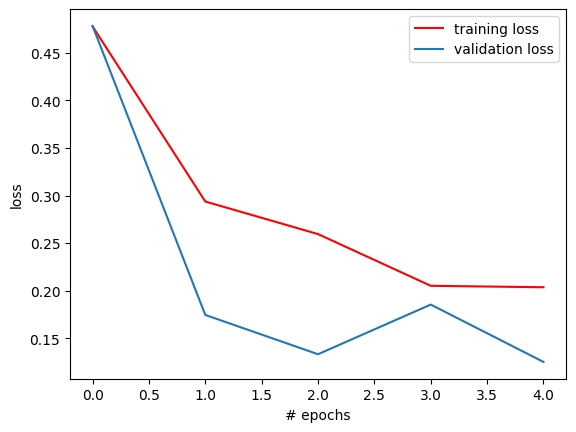

In [28]:
plt.plot(history2.history['loss'],'r',label='training loss')
plt.plot(history2.history['val_loss'],label='validation loss')
plt.xlabel('# epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

## Prediction on a random test image

1/1 [==============================] - 0s 485ms/step
fc =  [[1.0000000e+00 1.4418011e-10 2.1452445e-35]]
labels to decode  {'partial_mask': 0, 'with_mask': 1, 'without_mask': 2}
argmax of fc  0


'partial_mask'

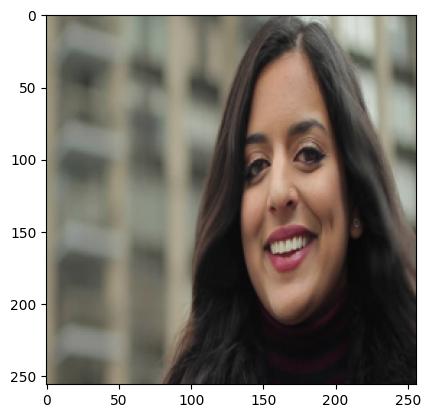

In [31]:
MODEL = model2
im = PIL.Image.open("/content/MP2_FaceMask_Dataset/test/without_mask/11.jpg")
im = im.resize((256, 256))
plt.imshow(im); # Display the image
im = np.array(im).reshape(1, 256, 256,3)    # Predict the result
predicted = MODEL.predict(im)
print("fc = ",predicted)
print("labels to decode ",train_generator.class_indices)
print("argmax of fc ",np.argmax(predicted))
list(train_generator.class_indices.keys())[np.argmax(predicted)]

# Part-B [5-Marks]

## Visualization [2 Marks]

Define a function 'get_img_array' that takes two parameters image path and target size. It returns the converted image to array.

Display this image.

Hint:: Consider AST3 for visualization.

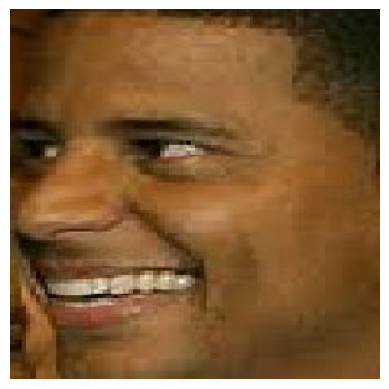

In [39]:
img_path = "/content/MP2_FaceMask_Dataset/test/without_mask/113.jpg"

def get_img_array(img_path, target_size):
    img = keras.utils.load_img(img_path, target_size=target_size)
    array = keras.utils.img_to_array(img) # converts image to np array
    # Add a dimension to transform the array into a “batch” of a single sample.
    array = np.expand_dims(array, axis=0)
    return array

img_tensor = get_img_array(img_path, target_size=(256, 256))     #resize image

plt.axis("off")
plt.imshow(img_tensor[0].astype("uint8"))
plt.show()

## Instantiating a model that returns "layer activations"

Hint:: Use 'keras.model' to define this model.

In [33]:
model2.input

<KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'conv2d_2_input')>

In [34]:
# Instantiating a model that returns "layer activations"
layer_outputs = []
layer_names = []
for layer in model2.layers:
    if isinstance(layer, (Conv2D, MaxPooling2D)):
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)
activation_model = keras.Model(inputs=model2.input, outputs=layer_outputs)
print(layer_outputs)
print(layer_names)

[<KerasTensor: shape=(None, 254, 254, 16) dtype=float32 (created by layer 'conv2d_2')>, <KerasTensor: shape=(None, 127, 127, 16) dtype=float32 (created by layer 'max_pooling2d_2')>, <KerasTensor: shape=(None, 125, 125, 32) dtype=float32 (created by layer 'conv2d_3')>, <KerasTensor: shape=(None, 62, 62, 32) dtype=float32 (created by layer 'max_pooling2d_3')>, <KerasTensor: shape=(None, 61, 61, 64) dtype=float32 (created by layer 'conv2d_4')>, <KerasTensor: shape=(None, 30, 30, 64) dtype=float32 (created by layer 'max_pooling2d_4')>, <KerasTensor: shape=(None, 29, 29, 128) dtype=float32 (created by layer 'conv2d_5')>, <KerasTensor: shape=(None, 14, 14, 128) dtype=float32 (created by layer 'max_pooling2d_5')>]
['conv2d_2', 'max_pooling2d_2', 'conv2d_3', 'max_pooling2d_3', 'conv2d_4', 'max_pooling2d_4', 'conv2d_5', 'max_pooling2d_5']


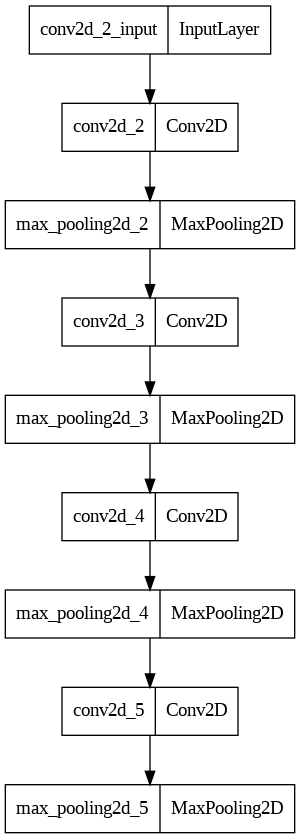

In [37]:
plot_model(activation_model)

Once the activation model is defined, predict the image tensor created using this model.

In [40]:
# Compute layer activations
activations = activation_model.predict(img_tensor)
print(f"no. of outputs: {len(activations)}")

first_layer_feature_maps = activations[0]
print(f"the first layer activation shape {first_layer_feature_maps.shape}")

1/1 [==============================] - 0s 118ms/step
no. of outputs: 8
the first layer activation shape (1, 254, 254, 16)


## Visualize first feature map

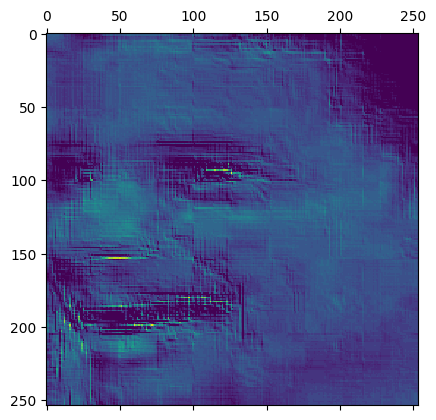

In [44]:
# Visualise activation

plt.matshow(first_layer_feature_maps[0, :, :, 2].astype("uint8"))



## Visualize feature map after each layer

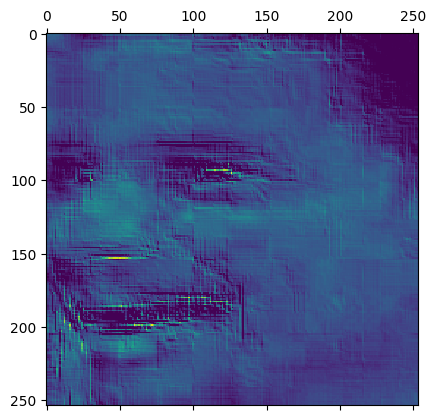

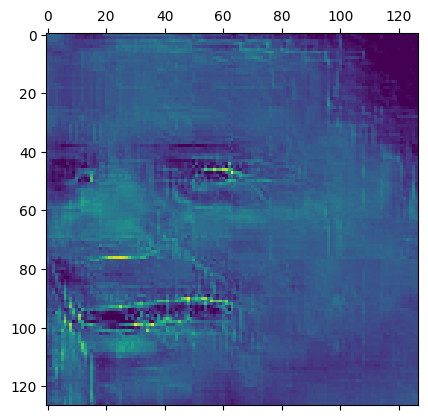

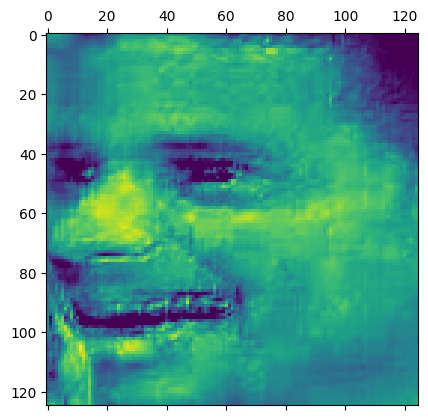

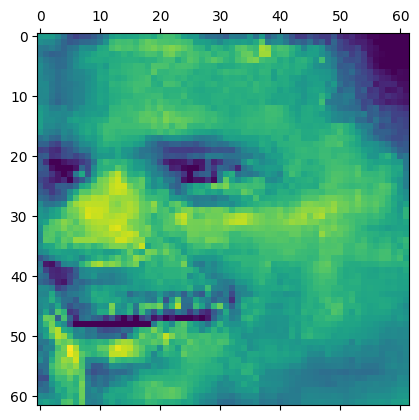

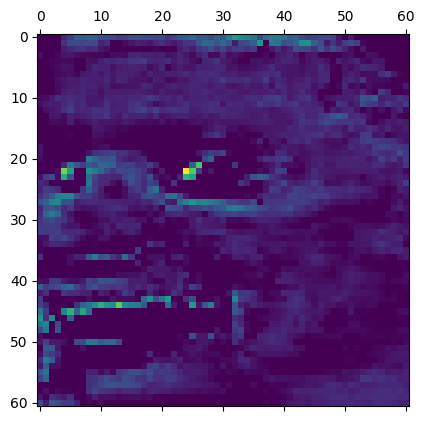

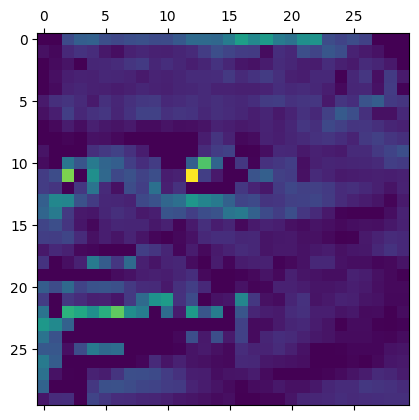

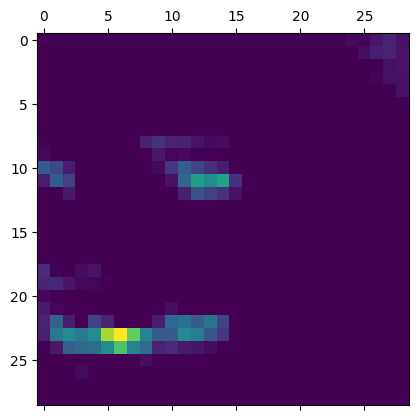

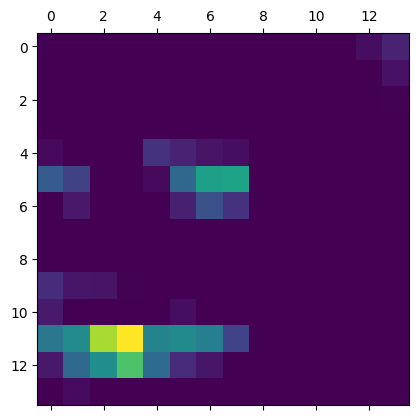

In [46]:
for i in range(len(activations)):
    plt.matshow(activations[i][0, :, :, 2], cmap = "viridis")

Successive feature maps are of smaller dimensions but scaled to be the same size during visualization.

## Visualise all the feature maps of all the layers

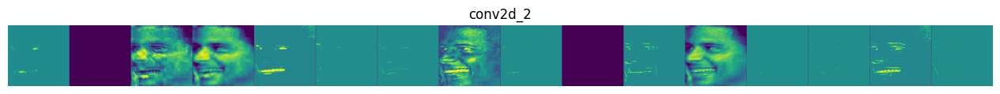

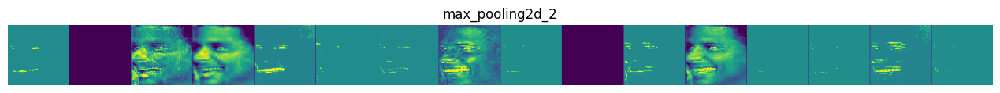

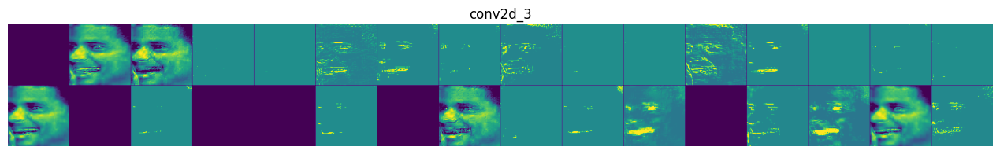

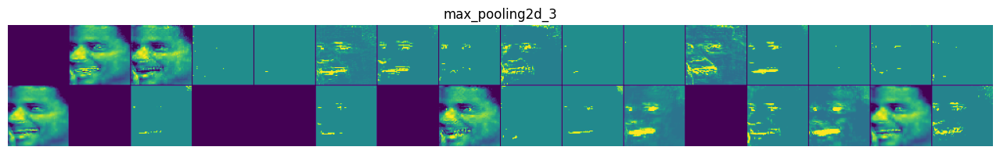

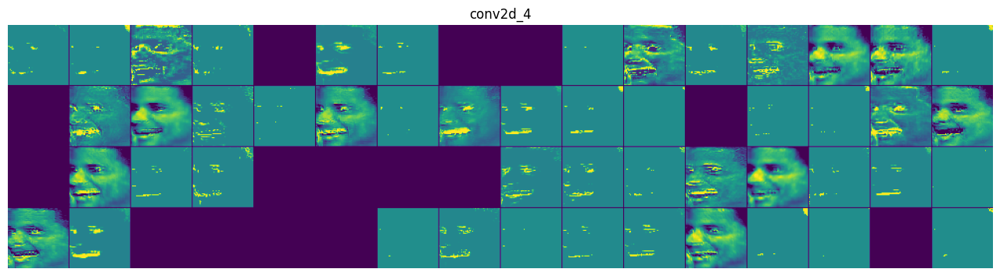

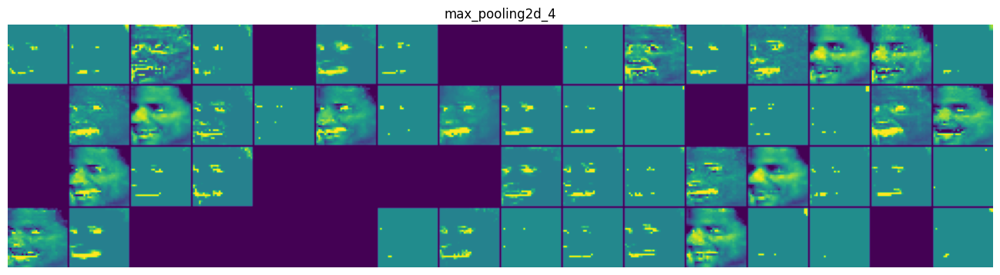

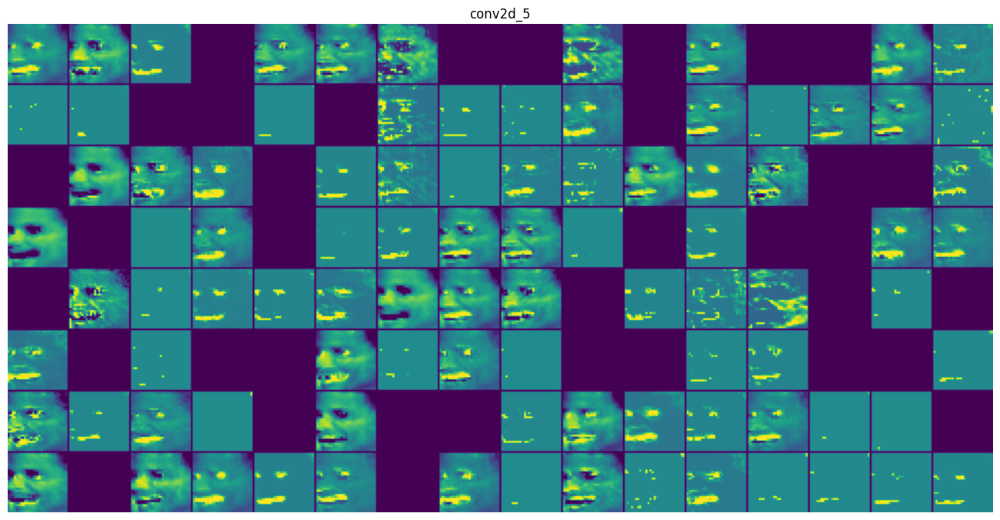

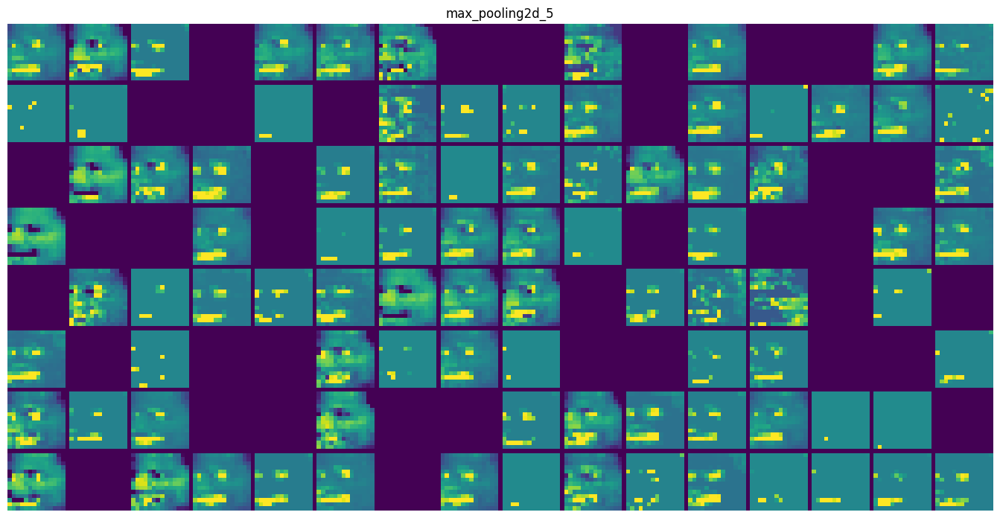

In [47]:
# Post-processing code - only visualizaton
# Visualizing every channel in every intermediate activation
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros(((size + 1) * n_cols - 1,
                             images_per_row * (size + 1) - 1))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

# ConvNet Filters [1 Mark]

## Print the names of  conv and MaxPooling layers.

Hint:: 'model2.layer'

In [51]:
# YOUR CODE HERE
for layer in model2.layers:
    if isinstance(layer, (keras.layers.Conv2D, keras.layers.MaxPooling2D)):
        print(layer.name)

conv2d_2
max_pooling2d_2
conv2d_3
max_pooling2d_3
conv2d_4
max_pooling2d_4
conv2d_5
max_pooling2d_5


## Create a feature extractor model

In [52]:
layer_name = 'max_pooling2d_2'
layer = model2.get_layer(name = layer_name)
feature_extractor = keras.Model(inputs = model2.input, outputs = layer.output)
# Check the model summary
feature_extractor.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2_input (InputLayer  [(None, 256, 256, 3)]     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 127, 127, 16)      0         
 g2D)                                                            
                                                                 
Total params: 448 (1.75 KB)
Trainable params: 448 (1.75 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


## Use the feature extractor model to extract feature out of the image tensor.

In [53]:
activation = feature_extractor(
    keras.applications.xception.preprocess_input(img_tensor)
)

Define a function 'compute_loss' it takes two arguments, image and filter index. It returns the filter activation using 'tf.reduce_mean'.

In [54]:
def compute_loss(image, filter_index):
    activation = feature_extractor(image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

## Loss maximization via stochastic gradient ascent.
Define a function to implement this step.

In [55]:
@tf.function
def gradient_ascent_step(image, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = compute_loss(image, filter_index)
    grads = tape.gradient(loss, image)
    grads = tf.math.l2_normalize(grads)    # Normalize the gradient
    image += learning_rate * grads
    return image

## Define a function to generate filter visualizations

This function uses gradient ascent to generate an image that maximizes the activation of a given filter in a CNN.

In [58]:
img_width = 256
img_height = 256

def generate_filter_pattern(filter_index):
    iterations = 30
    learning_rate = 10.
    image = tf.random.uniform(
        minval=0.4,
        maxval=0.6,
        shape=(1, img_width, img_height, 3))
    for i in range(iterations):
        image = gradient_ascent_step(image, filter_index, learning_rate)
    return image[0].numpy()

## Define a function to convert a tensor into a valid image

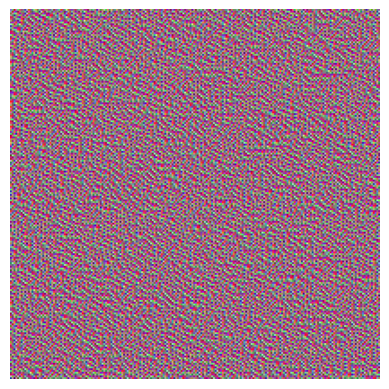

In [59]:
def deprocess_image(image):
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :]
    return image

plt.axis("off")
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=2)))

Generate a list of images, where each image in the list represents the activation pattern of a particular filter in the given layer.

In [60]:
# Post processing- Just visualization
# Generating a grid of all filter response patterns in a layer

all_images = []
for filter_index in range(15):
    print(f"Processing filter {filter_index}")
    image = deprocess_image(
        generate_filter_pattern(filter_index)
    )
    all_images.append(image)

Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14


Stitch together all the images in the 'all_images' list and save the resulting image as a PNG file. The resulting image shows a grid of all the filter activation patterns in the given layer.

In [61]:
margin = 5
n = 2
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

for i in range(n):
    for j in range(n):
        image = all_images[i * n + j]
        stitched_filters[
            (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
            (cropped_height + margin) * j : (cropped_height + margin) * j
            + cropped_height,
            :,
        ] = image

keras.utils.save_img(
    f"filters_for_layer_{layer_name}.png", stitched_filters)

Display the images

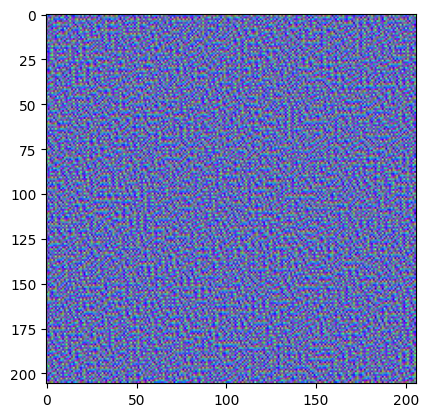

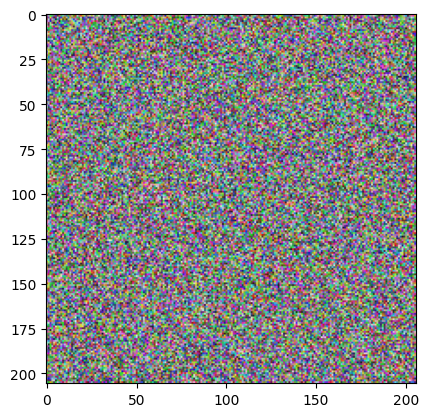

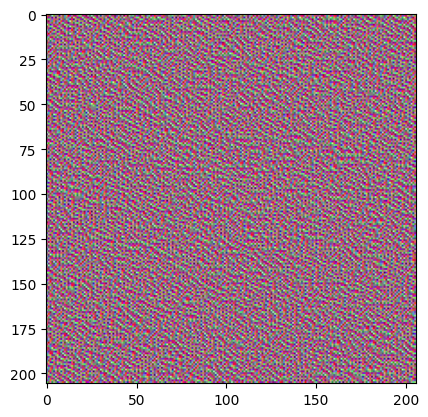

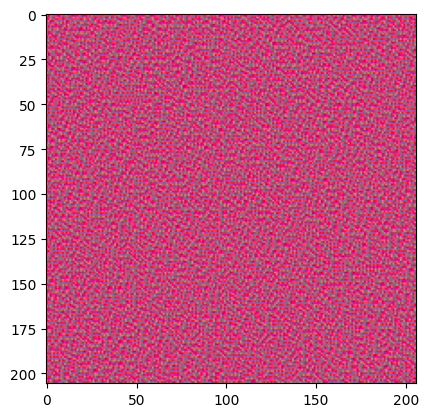

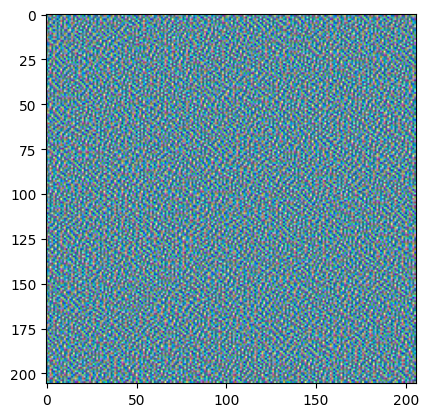

...

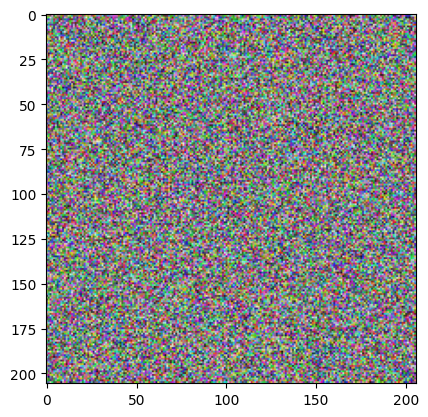

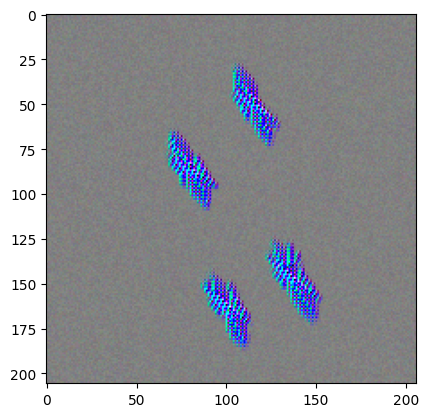

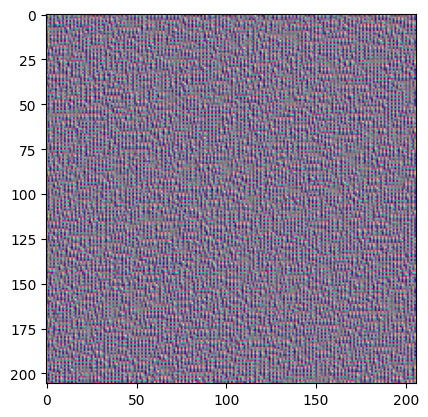

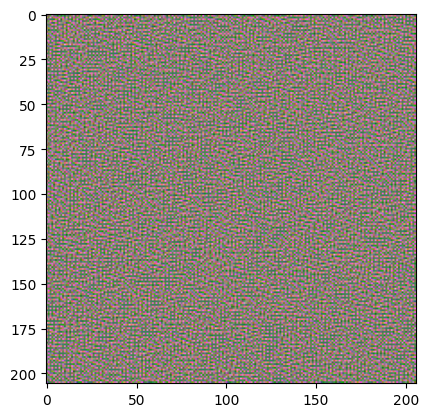

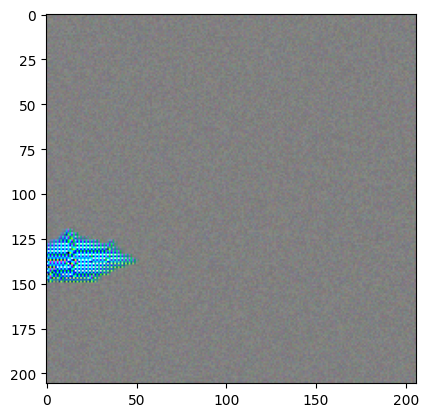

In [62]:
# plt.figure(figsize=(40,40))
# plt.matshow(stitched_filters)

for i in range(13):
  plt.figure()
  plt.imshow((all_images[i]))

All the steps discussed in visualization section can be easily understood from AST3.

## Transfer Learning [2 Marks]

Transfer learning consists of taking features learned on one problem, and leveraging them on a new, similar problem.

A pre-trained model is a saved network that was previously trained on a large dataset, typically on a large-scale image-classification task.

The intuition behind transfer learning for image classification is that if a model is trained on a large and general enough dataset, this model will effectively serve as a generic model of the visual world. You can then take advantage of these learned feature maps without having to start from scratch by training a large model on a large dataset.

For eg. Using VGG16, we remove the last layer which takes a probability for each of the 1000 classes in the ImageNet and replaces it with a layer that takes 3 probabilities in our case.

### Use the pre-trained models ([VGG16](https://www.tensorflow.org/api_docs/python/tf/keras/applications/vgg16/VGG16) or [ResNet50](https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet50/ResNet50))

* Load the pre-trained model
* Fit and evaluate the data

Hint: [How to use pre-trained model](https://drive.google.com/file/d/1d5WSWQmdVYYcJhvhMcZMoK5-BPOC1B_7/view?usp=sharing)

#### Expected accuracy: More than 90%

Task-flow
* Initialize the network with the weights of Imagenet
* Fine tune the network by modifying fully connected layers.
* Re-train the model with our problem data

#### VGG16

Define the pre-trained vgg model with dense layers.

Display the model summary

In [67]:
input_shape=(256,256,3) # Shape of image passed
model_vgg = Sequential()
model_vgg.add(VGG16(weights='imagenet',include_top=False,input_shape=(input_shape)))
model_vgg.add(Flatten())
model_vgg.add(Dense(128,activation="relu",kernel_initializer="he_normal",
                           kernel_regularizer=keras.regularizers.l2(0.01)))
model_vgg.add(Dense(train_generator.num_classes,activation='softmax'))
model_vgg.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 8, 8, 512)         14714688  
                                                                 
 flatten_3 (Flatten)         (None, 32768)             0         
                                                                 
 dense_7 (Dense)             (None, 128)               4194432   
                                                                 
 dense_8 (Dense)             (None, 3)                 387       
                                                                 
Total params: 18909507 (72.13 MB)
Trainable params: 18909507 (72.13 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [68]:
# Compile the model
optimizer_adam = keras.optimizers.Adam(learning_rate=0.00001)
model_vgg.compile(optimizer=optimizer_adam, loss='categorical_crossentropy', metrics=['acc'])

Fit the data to the model

In [69]:
history3 = model_vgg.fit(train_generator,epochs=5,
                              validation_data=test_generator, class_weight={0:1.0,1:0.8,2:1.2})

Epoch 1/5
158/158 [==============================] - 196s 1s/step - loss: 2.7058 - acc: 0.8700 - val_loss: 2.3199 - val_acc: 0.9857
Epoch 2/5
158/158 [==============================] - 154s 973ms/step - loss: 2.2294 - acc: 0.9761 - val_loss: 2.0829 - val_acc: 0.9944
Epoch 3/5
158/158 [==============================] - 142s 901ms/step - loss: 2.0064 - acc: 0.9829 - val_loss: 1.8978 - val_acc: 0.9929
Epoch 4/5
158/158 [==============================] - 174s 1s/step - loss: 1.8197 - acc: 0.9861 - val_loss: 1.7262 - val_acc: 0.9929
Epoch 5/5
158/158 [==============================] - 130s 816ms/step - loss: 1.6566 - acc: 0.9887 - val_loss: 1.6027 - val_acc: 0.9905


Plot training and validation loss

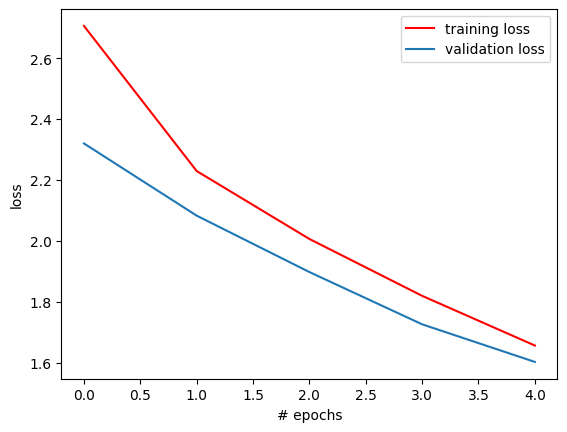

In [70]:
plt.plot(history3.history['loss'],'r',label='training loss')
plt.plot(history3.history['val_loss'],label='validation loss')
plt.xlabel('# epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

#### ResNet50

Define the pre-trained resnet model with dense layers

In [71]:
input_shape = (256, 256, 3)
model_resnet = Sequential()
model_resnet.add(ResNet50(weights = 'imagenet', include_top = False, input_shape = input_shape))
model_resnet.add(Flatten())
model_resnet.add(Dense(128))
model_resnet.add(Dense(train_generator.num_classes,activation='softmax'))
model_resnet.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['acc'])
model_resnet.build((next(train_generator)[0].shape))
model_resnet.summary()

94765736/94765736 [==============================] - 0s 0us/step
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 flatten_4 (Flatten)         (None, 131072)            0         
                                                                 
 dense_9 (Dense)             (None, 128)               16777344  
                                                                 
 dense_10 (Dense)            (None, 3)                 387       
                                                                 
Total params: 40365443 (153.98 MB)
Trainable params: 40312323 (153.78 MB)
Non-trainable params: 53120 (207.50 KB)
_________________________________________________________________


Fit the data to the model

In [72]:
history3 = model_resnet.fit(train_generator,epochs=5,
                    validation_data=test_generator)

Epoch 1/5
158/158 [==============================] - 169s 833ms/step - loss: 8.5447 - acc: 0.8109 - val_loss: 1.3715 - val_acc: 0.4241
Epoch 2/5
158/158 [==============================] - 124s 787ms/step - loss: 0.8353 - acc: 0.8813 - val_loss: 7403.7871 - val_acc: 0.2566
Epoch 3/5
158/158 [==============================] - 119s 750ms/step - loss: 0.5629 - acc: 0.8906 - val_loss: 1.0858 - val_acc: 0.4241
Epoch 4/5
158/158 [==============================] - 119s 755ms/step - loss: 0.6684 - acc: 0.8960 - val_loss: 1.0897 - val_acc: 0.4249
Epoch 5/5
158/158 [==============================] - 120s 756ms/step - loss: 0.2006 - acc: 0.9314 - val_loss: 1.0181 - val_acc: 0.6283


Plot the validation and training loss

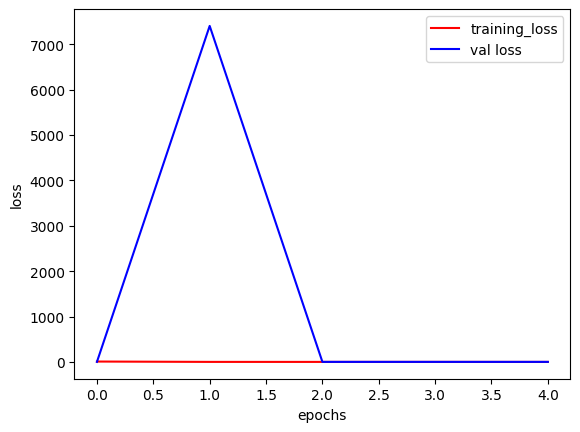

In [73]:
plt.plot(history3.history['loss'], 'r', label = 'training_loss')
plt.plot(history3.history['val_loss'], 'b', label = 'val loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

### Capture the live image using the below code cell and predict

<IPython.core.display.Javascript object>

Saved to photo.jpg


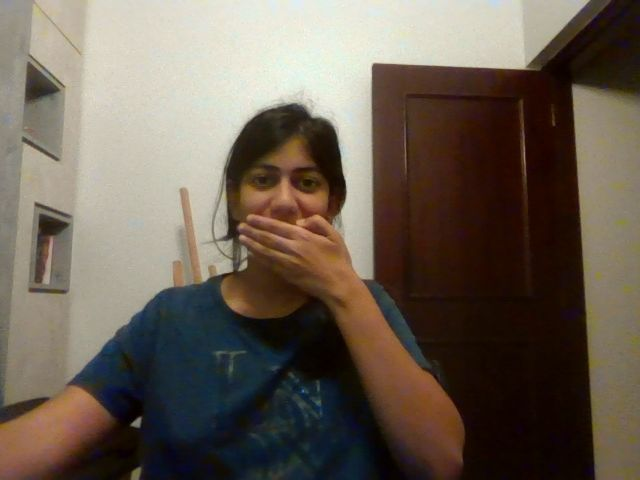

In [78]:
#@title Capture the photo
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  display(Image(filename))
except Exception as err:
  print(str(err))

After executing above cell and capturing the photo, load the captured photo and predict with model.

**Note:**
* Convert the image to numpy array and resize to the shape which model accept.
* Extend the dimension (to 4-D shape) of an image, as the model is trained on a batch of inputs.

1/1 [==============================] - 0s 18ms/step
fc =  [[0. 0. 1.]]
labels to decode  {'partial_mask': 0, 'with_mask': 1, 'without_mask': 2}
argmax of fc  2


'without_mask'

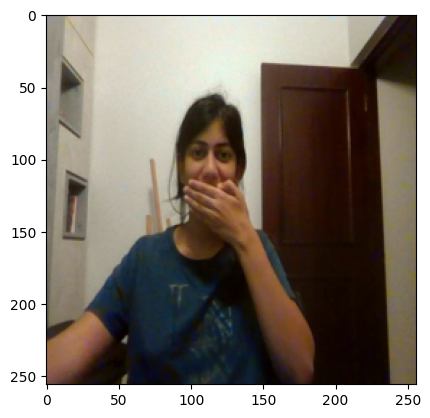

In [79]:
# Make a prediction using model that is created by making use of transer learning technique
MODEL = model_vgg
features = PIL.Image.open("photo.jpg")
features = features.resize((256, 256))
plt.imshow(features);
features = np.array(features).reshape(1, 256,256,3)
predicted = MODEL.predict(features)
print("fc = ",predicted)
print("labels to decode ",train_generator.class_indices)
print("argmax of fc ",np.argmax(predicted))
list(train_generator.class_indices.keys())[np.argmax(predicted)]

### Report Analysis

- Compare the accuracies for the Pre-trained vs CNN models
- Which model detects the mask/no mask/ partial mask more accurately with the live pictures?
- What process was followed to tune the hyperparameters?